前向计算->计算损失->计算梯度->更新参数

## 时间序列、文本、依赖问题 Time Series, Text, Dependency Problems 
+ 时间序列 Time Series 现在的状态与历史的状态有一定的关系，比如销售额，前几天销售额比较高，今天的销售额有可能也比较高，或者前几天销售额比较高，导致没有库存，今天的销售额有可能也比较低
+ 文本 Text 某一段文字前后出现的字，都是有一定的关系，字具体的意义与前后的文字也有关系
+ 有限状态机 Finite State Machines 编译器：代码一行一行运行，运行进计算机后，产生一定的行为，此时的行为依赖于前边所有的代码，手机：4G、5G编码
+ 依赖问题 Dependency Problems 

## 上述问题统称为序列问题

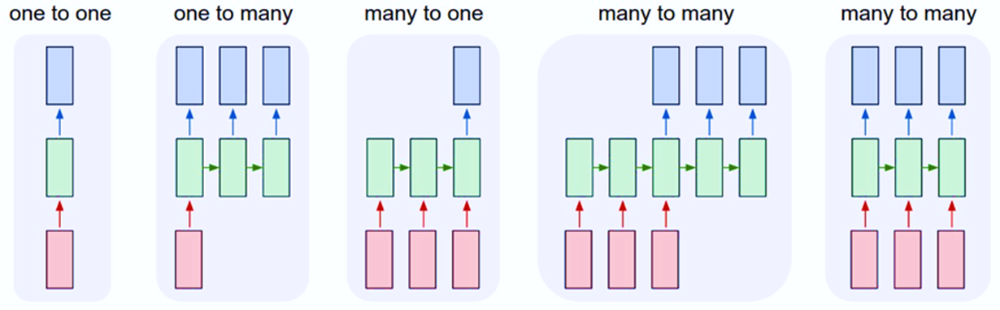

+ 例子1  输入：一张图片，输出：<p1,p2,p3,p4,p5,p6> 分类的概率 one to one
+ 例子2  输入：一张图片，输出：<一个乖巧宝宝> one to many

例子2中的输出，前后是有依赖关系的 Dependency Problems 

上图中的many是指输入或者输出，有没有依赖关系

+ many to one 输入：<今天真的不开心/很不开心>，输出：Negative/-3/-5
+ many to many 输入：<$knowledge$ is power>，输出：<知识就是力量>
+ many to many分为，输入输入完，才可以得出；边输入边输出

#### 现实生活中的问题，都可以抽象成上图中问题，one to one，one to many，many to one，many to many

In [1]:
# 斐波那契数列
def fib(n):
    if n==0 or n==1: return 1
    else:
        return fib(n-1) + fib(n-2)

In [2]:
# 阶乘
def fac(n):
    if n==0: return 1
    else:
        return n * fac(n-1)

In [3]:
for i in range(10): print(f'{fib(i)}\t{fac(i)}') # \t水平制表符

1	1
1	1
2	2
3	6
5	24
8	120
13	720
21	5040
34	40320
55	362880


#### 斐波那契数列，阶乘下一步的结果依赖于上一步，都存在依赖关系

In [4]:
import pandas as pd

In [5]:
timeserise_revenue = pd.read_csv('time_serise_revenue.csv')

# sales_data = pd.read_csv('time_serise_sale.csv')

timeserise_revenue.head()

,Unnamed: 0,day_1,day_2,day_3,day_4,day_5,day_6,day_7,day_8,day_9,...,day_51,day_52,day_53,day_54,day_55,day_56,day_57,day_58,day_59,day_60
0,0,2.622866,2.657832,2.771121,2.815845,2.876267,2.859229,2.844758,2.793797,2.736443,...,1.228701,1.290414,1.474886,1.563295,1.736197,1.797285,1.978940,2.198979,2.277908,2.403300
1,1,2.057578,2.089561,2.138827,2.189964,2.224312,2.213340,2.197103,2.079228,2.072745,...,1.880965,1.869619,1.872043,1.854963,1.846967,1.878265,1.868918,1.877923,1.975341,1.959734
2,2,2.485055,2.349254,2.284784,2.142335,2.048803,1.990668,1.965783,1.866983,1.816916,...,2.714773,2.792819,2.788505,2.879778,2.873212,2.854421,2.863193,2.773218,2.708913,2.590657
3,3,2.053928,2.121919,2.148003,2.179574,2.161062,2.124168,2.153791,2.097816,1.953759,...,1.861072,1.875642,1.782617,1.768666,1.876252,1.815870,1.870878,1.923176,2.025993,2.048272
4,4,1.702631,1.825995,2.038047,2.194083,2.313903,2.417883,2.567613,2.650782,2.729691,...,1.258760,1.137150,1.109007,1.104999,1.150137,1.204513,1.221350,1.327023,1.387304,1.557363


In [6]:
timeserise_revenue = timeserise_revenue.set_index('Unnamed: 0')
timeserise_revenue.index.name = None
timeserise_revenue.head()

,day_1,day_2,day_3,day_4,day_5,day_6,day_7,day_8,day_9,day_10,...,day_51,day_52,day_53,day_54,day_55,day_56,day_57,day_58,day_59,day_60
0,2.622866,2.657832,2.771121,2.815845,2.876267,2.859229,2.844758,2.793797,2.736443,2.655966,...,1.228701,1.290414,1.474886,1.563295,1.736197,1.797285,1.978940,2.198979,2.277908,2.403300
1,2.057578,2.089561,2.138827,2.189964,2.224312,2.213340,2.197103,2.079228,2.072745,1.951091,...,1.880965,1.869619,1.872043,1.854963,1.846967,1.878265,1.868918,1.877923,1.975341,1.959734
2,2.485055,2.349254,2.284784,2.142335,2.048803,1.990668,1.965783,1.866983,1.816916,1.816590,...,2.714773,2.792819,2.788505,2.879778,2.873212,2.854421,2.863193,2.773218,2.708913,2.590657
3,2.053928,2.121919,2.148003,2.179574,2.161062,2.124168,2.153791,2.097816,1.953759,1.962948,...,1.861072,1.875642,1.782617,1.768666,1.876252,1.815870,1.870878,1.923176,2.025993,2.048272
4,1.702631,1.825995,2.038047,2.194083,2.313903,2.417883,2.567613,2.650782,2.729691,2.876534,...,1.258760,1.137150,1.109007,1.104999,1.150137,1.204513,1.221350,1.327023,1.387304,1.557363


In [7]:
timeserise_revenue.sample()

,day_1,day_2,day_3,day_4,day_5,day_6,day_7,day_8,day_9,day_10,...,day_51,day_52,day_53,day_54,day_55,day_56,day_57,day_58,day_59,day_60
8559,2.894679,2.845163,2.746425,2.734316,2.555317,2.450537,2.393594,2.249011,2.152677,2.118334,...,2.040173,2.191327,2.295797,2.413589,2.528136,2.67404,2.755891,2.831852,2.90606,2.869923


In [8]:
timeserise_revenue.sample().values[0]

array([2.25906395, 2.44244942, 2.54336336, 2.64621692, 2.80866365,
       2.80395928, 2.86578965, 2.8337107 , 2.89168111, 2.82225861,
       2.74221002, 2.72663605, 2.57485487, 2.45586372, 2.3791045 ,
       2.27383074, 2.16572315, 2.0626811 , 1.99521777, 1.92301051,
       1.8642607 , 1.88270406, 1.81765548, 1.77910758, 1.84067089,
       1.83936821, 1.91329407, 1.96609169, 2.02259691, 2.02006932,
       2.07001828, 2.12233526, 2.14927941, 2.19949288, 2.14530175,
       2.13746444, 2.15144267, 2.02419659, 1.96631598, 1.90349942,
       1.81099266, 1.72875969, 1.61850031, 1.45625166, 1.44835771,
       1.34185976, 1.22153789, 1.15331602, 1.1527279 , 1.0912186 ,
       1.10258386, 1.21101035, 1.19400063, 1.34651965, 1.4176261 ,
       1.53065008, 1.71212832, 1.87722231, 2.02925079, 2.1236601 ])

In [9]:
import matplotlib.pyplot as plt

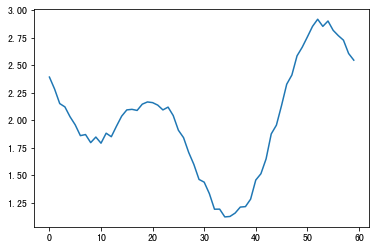

In [10]:
plt.plot(timeserise_revenue.sample().values[0])

+ 一行数据为一家公司两个月的营业额

#### 问题
+ 现已知10天的营收，要预测第11天的营收
+ 每个x是10天的营收，训练数据是第11天的数据
+ 现实工作中，为了让时间预测的效果更好，会做成：每个x是第i天到i+9这十天的营收，target数据y是第i+1到i+10的数据，这样要求比上边的更加严格

#### Sequence Problem Using Linear Model 
#### With Pytorch

In [11]:
class FindPartner:
    def __init__(self,name): # 类有一个名为 __init__() 的特殊方法（构造方法），该方法在类实例化时会自动调用，
        self.name = name
        
    def __call__(self,another): # __call__: 函数调用
        return self.say_hello(another)
        
    def say_hello(self,another):
        print(f'{self.name}快来和我玩，我是{another}!')

In [12]:
findpartner = FindPartner('老刘') # 实例化类，填入的‘老刘’对应__init__后括号内的name

In [13]:
findpartner('老张')

老刘快来和我玩，我是老张!


In [14]:
import torch
import torch.nn as nn #nn是torch的neural network
import numpy as np

In [15]:
# 建立一个全连接模型
# 每个pytorch的model必须得是pytorch的一个子类，因为要进行forward，调整参数等
class FullyConnected(nn.Module):
    def __init__(self, x_size, hidden_size, output_size): # 输入n*10,hidden layer,输出n*10
        # super() 函数是用于调用父类(超类)的一个方法。super() 是用来解决多重继承问题的
        super(FullyConnected, self).__init__() # 父类里有初始化非方法，在定义新的的时候，要让父类初始化。
        self.hidden_size = hidden_size

        self.linear_with_tanh = nn.Sequential( # 两层神经网络
            nn.Linear(x_size, self.hidden_size), # 线性变换 wx+b
            nn.Tanh(), # 非线性变换，激活函数
            nn.Linear(self.hidden_size, self.hidden_size),
            nn.Tanh(),
            nn.Linear(self.hidden_size, output_size)
        )
        
    def forward(self, x):
        yhat = self.linear_with_tanh(x)
        
        return yhat

In [16]:
some_test = np.array([[i for i in range(10)]])

In [17]:
fc_model = FullyConnected(x_size=10, hidden_size=8, output_size=10)

In [18]:
some_test

array([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])

In [19]:
##TENSOR 一种特殊的高维数组，高维向量，一维：数组，二维：平面，三维：矩形
torch.from_numpy(some_test)

tensor([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])

In [20]:
fc_model(torch.from_numpy(some_test).float()) # 调用forward函数，调用self.linear_with_tanh，运行线性非线性变换

tensor([[ 0.2510,  0.2746,  0.1482, -0.1008,  0.0086, -0.3862,  0.1590,  0.0814,
         -0.0971, -0.1307]], grad_fn=<AddmmBackward>)

In [21]:
from torch import optim 

In [22]:
# 输出中有requires_grad=True，说明是可以训练的，如梯度下降
for p in fc_model.parameters():
    print (p)

Parameter containing:
tensor([[ 0.0046,  0.1652,  0.2767,  0.1347,  0.0388,  0.3030,  0.0176,  0.2194,
          0.2658,  0.0071],
        [-0.2434, -0.2971,  0.2885, -0.2836, -0.1759,  0.0479,  0.1071,  0.0751,
         -0.0589, -0.1662],
        [-0.2987, -0.1517,  0.0363, -0.1532, -0.2906, -0.2999, -0.1908, -0.0876,
         -0.2145, -0.1591],
        [ 0.2457, -0.0960, -0.2471, -0.0053,  0.0575,  0.2275, -0.2413, -0.0909,
         -0.1117, -0.3104],
        [-0.1658, -0.2679, -0.3007,  0.2857,  0.1722, -0.0309,  0.2332,  0.1677,
         -0.2853, -0.0444],
        [-0.1723,  0.2029, -0.2073,  0.0383,  0.0188, -0.1207,  0.3120, -0.0426,
          0.2242, -0.0579],
        [-0.1543,  0.0574,  0.0506,  0.0340,  0.0236,  0.1967, -0.2814, -0.0838,
          0.1430, -0.0288],
        [-0.0239,  0.1898,  0.2094,  0.2908,  0.3112,  0.1329, -0.1480, -0.2293,
         -0.2928,  0.2363]], requires_grad=True)
Parameter containing:
tensor([ 0.0294, -0.1572, -0.1696,  0.3041, -0.2581,  0.0344,  

In [23]:
for p in fc_model.parameters():
    print (p.name,p.data)

None tensor([[ 0.0046,  0.1652,  0.2767,  0.1347,  0.0388,  0.3030,  0.0176,  0.2194,
          0.2658,  0.0071],
        [-0.2434, -0.2971,  0.2885, -0.2836, -0.1759,  0.0479,  0.1071,  0.0751,
         -0.0589, -0.1662],
        [-0.2987, -0.1517,  0.0363, -0.1532, -0.2906, -0.2999, -0.1908, -0.0876,
         -0.2145, -0.1591],
        [ 0.2457, -0.0960, -0.2471, -0.0053,  0.0575,  0.2275, -0.2413, -0.0909,
         -0.1117, -0.3104],
        [-0.1658, -0.2679, -0.3007,  0.2857,  0.1722, -0.0309,  0.2332,  0.1677,
         -0.2853, -0.0444],
        [-0.1723,  0.2029, -0.2073,  0.0383,  0.0188, -0.1207,  0.3120, -0.0426,
          0.2242, -0.0579],
        [-0.1543,  0.0574,  0.0506,  0.0340,  0.0236,  0.1967, -0.2814, -0.0838,
          0.1430, -0.0288],
        [-0.0239,  0.1898,  0.2094,  0.2908,  0.3112,  0.1329, -0.1480, -0.2293,
         -0.2928,  0.2363]])
None tensor([ 0.0294, -0.1572, -0.1696,  0.3041, -0.2581,  0.0344,  0.0991, -0.2488])
None tensor([[-1.2481e-01, -4.8811e-

In [24]:
criterion = nn.MSELoss() # LOSS

# 除了梯度下降，还有很多别的优化方法，此处用的SGD
optimizer = optim.SGD(fc_model.parameters(),lr=0.01)

losses = []

In [25]:
for iter_ in range(100):
    inputs = torch.from_numpy(some_test).float() # 输入
    
    targets = torch.from_numpy(some_test + 1).float() # 输出
    
    outputs = fc_model(inputs) # yhat
    
    loss = criterion(outputs,targets) # loss
    
    # torch在训练的时候，会默认在每一轮训练的时候，把上一轮训练的梯度留下来，下一次求得的梯度加上它形成新的梯度，某些情况适用，此处不需要
    # 梯度清零，不然会出错
    optimizer.zero_grad() 
    
    loss.backward() # 反向传播
    
    optimizer.step() # 更新权值
    
    losses.append(loss)

In [26]:
losses # loss一直在降低

[tensor(38.9079, grad_fn=<MseLossBackward>),
 tensor(38.1463, grad_fn=<MseLossBackward>),
 tensor(37.5721, grad_fn=<MseLossBackward>),
 tensor(37.0176, grad_fn=<MseLossBackward>),
 tensor(36.4609, grad_fn=<MseLossBackward>),
 tensor(35.8967, grad_fn=<MseLossBackward>),
 tensor(35.3219, grad_fn=<MseLossBackward>),
 tensor(34.7345, grad_fn=<MseLossBackward>),
 tensor(34.1334, grad_fn=<MseLossBackward>),
 tensor(33.5180, grad_fn=<MseLossBackward>),
 tensor(32.8883, grad_fn=<MseLossBackward>),
 tensor(32.2448, grad_fn=<MseLossBackward>),
 tensor(31.5886, grad_fn=<MseLossBackward>),
 tensor(30.9210, grad_fn=<MseLossBackward>),
 tensor(30.2435, grad_fn=<MseLossBackward>),
 tensor(29.5579, grad_fn=<MseLossBackward>),
 tensor(28.8660, grad_fn=<MseLossBackward>),
 tensor(28.1697, grad_fn=<MseLossBackward>),
 tensor(27.4706, grad_fn=<MseLossBackward>),
 tensor(26.7705, grad_fn=<MseLossBackward>),
 tensor(26.0710, grad_fn=<MseLossBackward>),
 tensor(25.3735, grad_fn=<MseLossBackward>),
 tensor(24

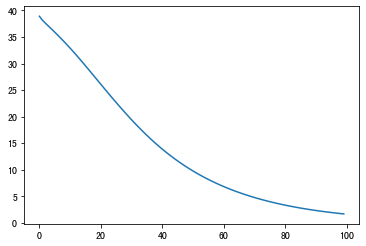

In [27]:
plt.plot(losses)

In [28]:
fc_model(torch.from_numpy(np.array([0,1,2,3,4,5,6,7,8,9])).float())

tensor([0.9128, 1.6221, 2.6987, 3.3401, 3.9052, 4.4547, 5.6998, 6.4867, 7.0322,
        8.0229], grad_fn=<AddBackward0>)

In [29]:
for iter_ in range(200):
    inputs = torch.from_numpy(some_test).float() # 输入
    
    targets = torch.from_numpy(some_test + 1).float() # 输出
    
    outputs = fc_model(inputs) # yhat
    
    loss = criterion(outputs,targets) # loss
    
    # torch在训练的时候，会默认在每一轮训练的时候，把上一轮训练的梯度留下来，下一次求得的梯度加上它形成新的梯度，某些情况适用，此处不需要
    # 梯度清零，不然会出错
    optimizer.zero_grad() 
    
    loss.backward() # 反向传播
    
    optimizer.step() # 更新权值
    
    losses.append(loss)

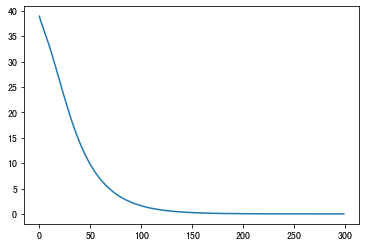

In [30]:
plt.plot(losses)

In [31]:
some_test = np.array([[i for i in range(10)]])
inputs = torch.from_numpy(some_test).float() # 输入
print(inputs)
targets = torch.from_numpy(some_test + 1).float() # 输出
print(targets)

tensor([[0., 1., 2., 3., 4., 5., 6., 7., 8., 9.]])
tensor([[ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]])


In [32]:
fc_model(torch.from_numpy(np.array([0,1,2,3,4,5,6,7,8,9])).float()) # 训练200次，效果明显比100次要好，训练的是fc_model

tensor([0.9982, 1.9899, 2.9930, 3.9828, 4.9704, 5.9580, 6.9661, 7.9603, 8.9474,
        9.9477], grad_fn=<AddBackward0>)

In [33]:
fc_model(torch.from_numpy(np.array([3,4,5,6,7,8,9,10,11,12])).float()) # 但是换一个数就不行了，说明训练的不够好，数据太少了

tensor([0.9983, 1.9900, 2.9933, 3.9831, 4.9708, 5.9584, 6.9667, 7.9609, 8.9482,
        9.9485], grad_fn=<AddBackward0>)

In [34]:
# 在spyder里，没有进度条
from tqdm import tqdm_notebook
import time

for i in tqdm_notebook(range(60)):
    time.sleep(1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


In [35]:
# 查看权重，值等非常便捷，这就是近些年pytorch比tensflow受欢迎的原因
# tensflow的计算比pytorch快，但是近些年随着计算机的发展，这一优势正在减小
fc_model.state_dict()

OrderedDict([('linear_with_tanh.0.weight',
              tensor([[ 0.0046,  0.1652,  0.2767,  0.1347,  0.0388,  0.3030,  0.0176,  0.2194,
                        0.2658,  0.0072],
                      [-0.2434, -0.3011,  0.2805, -0.2955, -0.1918,  0.0280,  0.0833,  0.0473,
                       -0.0907, -0.2020],
                      [-0.2987, -0.1517,  0.0363, -0.1532, -0.2906, -0.2999, -0.1908, -0.0876,
                       -0.2145, -0.1591],
                      [ 0.2457, -0.0961, -0.2473, -0.0056,  0.0571,  0.2270, -0.2420, -0.0916,
                       -0.1126, -0.3113],
                      [-0.1658, -0.2800, -0.3250,  0.2492,  0.1236, -0.0917,  0.1602,  0.0825,
                       -0.3826, -0.1539],
                      [-0.1723,  0.2064, -0.2003,  0.0487,  0.0326, -0.1034,  0.3328, -0.0184,
                        0.2519, -0.0268],
                      [-0.1543,  0.0692,  0.0743,  0.0695,  0.0709,  0.2559, -0.2104, -0.0009,
                        0.2377,  0.0777]

In [36]:
fc_model.state_dict()['linear_with_tanh.2.weight'].shape

torch.Size([8, 8])

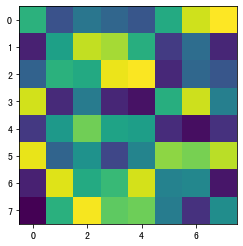

In [37]:
plt.imshow(fc_model.state_dict()['linear_with_tanh.2.weight'])

In [38]:
import random

In [39]:
# 随机取sample_size个数据
def sample_from_table(sample_size, dataframe):
    sample_row = dataframe.sample().values[0]
    
    begin_column = random.randint(0, len(sample_row) - sample_size - 1) 
    
    choosen_data = sample_row[begin_column:begin_column+sample_size+1]
    
    return (choosen_data[:sample_size], choosen_data[1:])

In [40]:
# 从timeserise_revenue中随机取一行数据的10期数据，第一个array为第i天到i+9这十天的营收，即为x，第二个array为第i+1到i+10的营收，即为y
sample_from_table(10, timeserise_revenue)

(array([2.38698807, 2.2571429 , 2.16913145, 2.12264427, 2.01965544,
        1.91223384, 1.84102202, 1.85538332, 1.78468166, 1.85522525]),
 array([2.2571429 , 2.16913145, 2.12264427, 2.01965544, 1.91223384,
        1.84102202, 1.85538332, 1.78468166, 1.85522525, 1.84842294]))

In [41]:
fc_model = FullyConnected(x_size=10, hidden_size=3, output_size=10)

criterion = nn.MSELoss() # LOSS

# 除了梯度下降，还有很多别的优化方法，此处用的SGD
optimizer = optim.SGD(fc_model.parameters(),lr=0.01)

losses = []

for iter_ in range(200):
    inputs_,targets_ = sample_from_table(10, timeserise_revenue)
    
    inputs = torch.from_numpy(inputs_).float() # 输入
    
    targets = torch.from_numpy(targets_).float() # 输出
    
    outputs = fc_model(inputs) # yhat
    
    loss = criterion(outputs,targets) # loss
    
    # torch在训练的时候，会默认在每一轮训练的时候，把上一轮训练的梯度留下来，下一次求得的梯度加上它形成新的梯度，某些情况适用，此处不需要
    # 梯度清零，不然会出错
    optimizer.zero_grad() 
    
    loss.backward() # 反向传播
    
    optimizer.step() # 更新权值
    
    losses.append(loss)

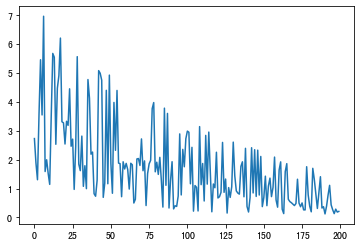

In [42]:
plt.plot(losses) # loss抖动的比较厉害

In [43]:
losses[-10:]

[tensor(0.1206, grad_fn=<MseLossBackward>),
 tensor(0.3862, grad_fn=<MseLossBackward>),
 tensor(0.7736, grad_fn=<MseLossBackward>),
 tensor(1.1096, grad_fn=<MseLossBackward>),
 tensor(0.4351, grad_fn=<MseLossBackward>),
 tensor(0.2668, grad_fn=<MseLossBackward>),
 tensor(0.1306, grad_fn=<MseLossBackward>),
 tensor(0.2856, grad_fn=<MseLossBackward>),
 tensor(0.1846, grad_fn=<MseLossBackward>),
 tensor(0.2070, grad_fn=<MseLossBackward>)]

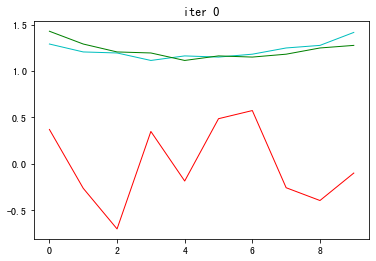

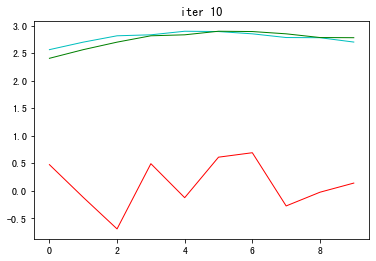

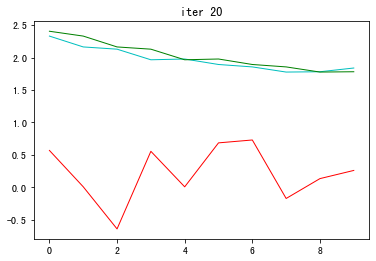

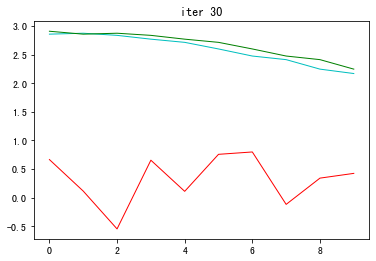

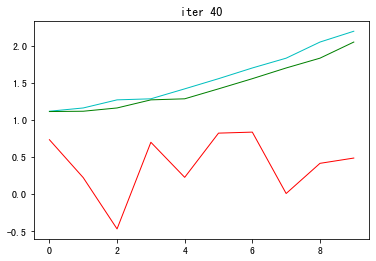

...

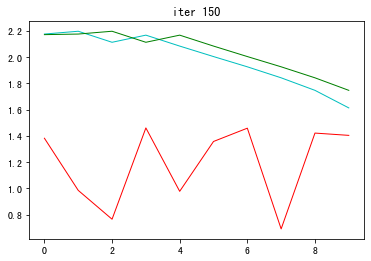

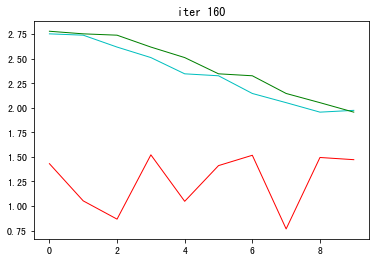

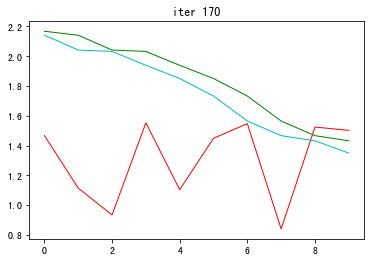

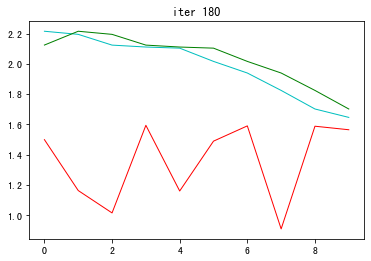

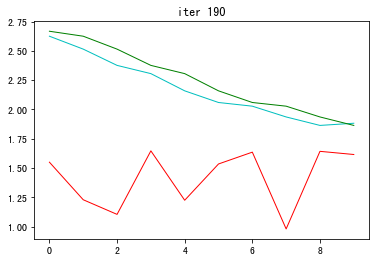

In [44]:
fc_model = FullyConnected(x_size=10, hidden_size=3, output_size=10)

criterion = nn.MSELoss() # LOSS

# 除了梯度下降，还有很多别的优化方法，此处用的SGD
optimizer = optim.SGD(fc_model.parameters(),lr=0.01)

losses = []

for iter_ in range(200):
    inputs_,targets_ = sample_from_table(10, timeserise_revenue)
    
    inputs = torch.from_numpy(inputs_).float() # 输入
    
    targets = torch.from_numpy(targets_).float() # 输出
    
    outputs = fc_model(inputs) # yhat
    
    loss = criterion(outputs,targets) # loss
    
    # torch在训练的时候，会默认在每一轮训练的时候，把上一轮训练的梯度留下来，下一次求得的梯度加上它形成新的梯度，某些情况适用，此处不需要
    # 梯度清零，不然会出错
    optimizer.zero_grad() 
    
    loss.backward() # 反向传播
    
    optimizer.step() # 更新权值
    
    losses.append(loss)
    
    if iter_ % 10 == 0:
        plt.clf()
        plt.ion()
        
        plt.title("iter {}".format(iter_))
        
        plt.plot(torch.flatten(outputs.detach()),'r-',linewidth=1,label='Output') # 预测数据 - 红色
        plt.plot(torch.flatten(targets),'c-',linewidth=1,label='Label') # 真实数据 - 浅蓝
        plt.plot(torch.flatten(inputs),'g-',linewidth=1,label='Input') # 输入数据 - 绿色
        
        plt.draw();
        plt.pause(0.05);

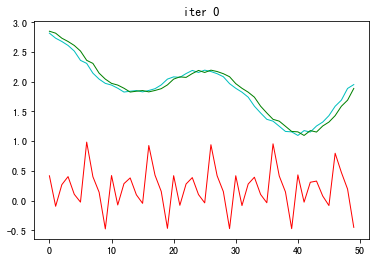

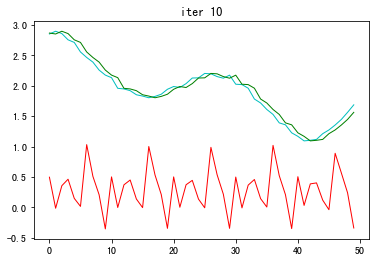

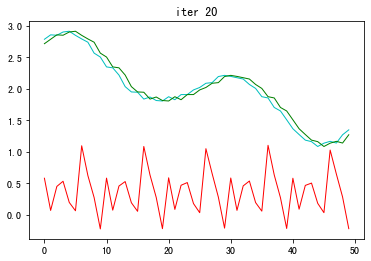

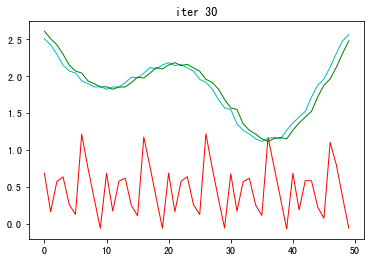

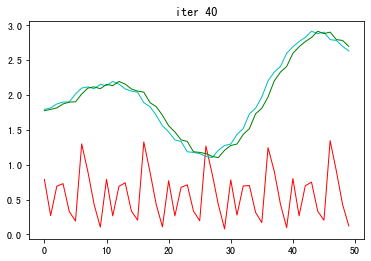

...

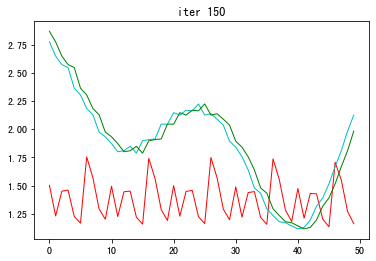

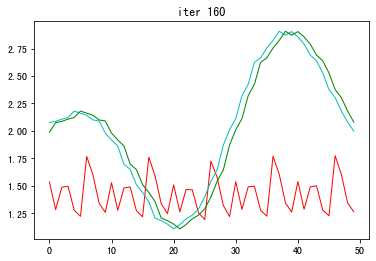

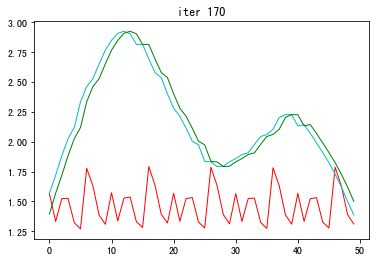

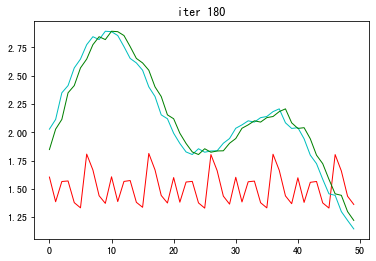

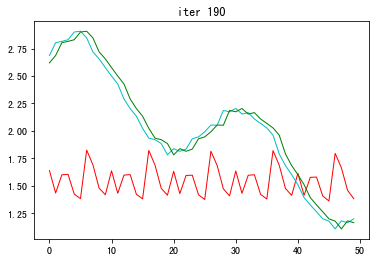

In [45]:
fc_model = FullyConnected(x_size=10, hidden_size=3, output_size=10)
fc_model = fc_model.double()

criterion = nn.MSELoss() # LOSS

# 除了梯度下降，还有很多别的优化方法，此处用的SGD
optimizer = optim.SGD(fc_model.parameters(),lr=0.01)

losses = []

for iter_ in range(200):
    inputs_,targets_ = sample_from_table(50, timeserise_revenue)
    
    inputs = torch.from_numpy(np.array([
                    inputs_[0:10], 
                    inputs_[10:20], 
                    inputs_[20:30], 
                    inputs_[30:40], 
                    inputs_[40:50]], dtype=np.double)) # 输入
    
    targets = torch.from_numpy(np.array([
                    targets_[0:10], 
                    targets_[10:20], 
                    targets_[20:30], 
                    targets_[30:40], 
                    targets_[40:50]], dtype=np.double)) # 输出
    
    outputs = fc_model(inputs) # yhat
    
    loss = criterion(outputs,targets) # loss
    
    # torch在训练的时候，会默认在每一轮训练的时候，把上一轮训练的梯度留下来，下一次求得的梯度加上它形成新的梯度，某些情况适用，此处不需要
    # 梯度清零，不然会出错
    optimizer.zero_grad() 
    
    loss.backward() # 反向传播
    
    optimizer.step() # 更新权值
    
    losses.append(loss)
    
    if iter_ % 10 == 0:
        plt.clf()
        plt.ion()
        
        plt.title("iter {}".format(iter_))
        
        plt.plot(torch.flatten(outputs.detach()),'r-',linewidth=1,label='Output') # 预测数据 - 红色
        plt.plot(torch.flatten(targets),'c-',linewidth=1,label='Label') # 真实数据 - 浅蓝
        plt.plot(torch.flatten(inputs),'g-',linewidth=1,label='Input') # 输入数据 - 绿色
        
        plt.draw();
        plt.pause(0.05);

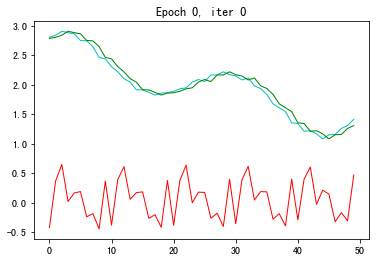

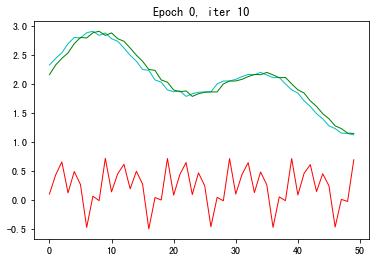

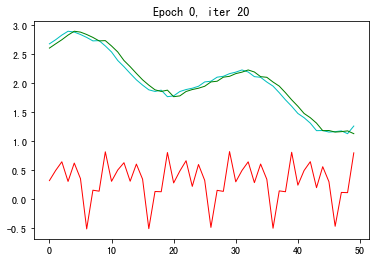

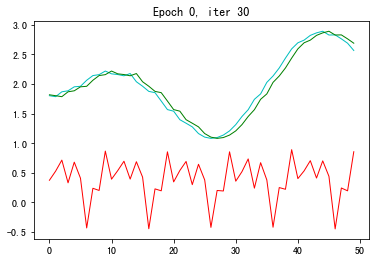

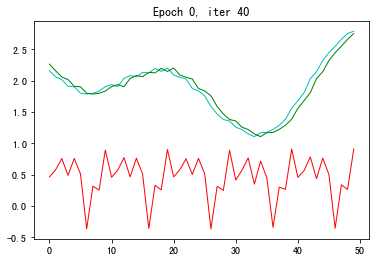

...

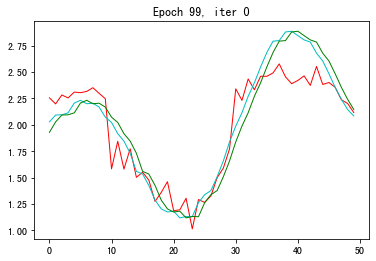

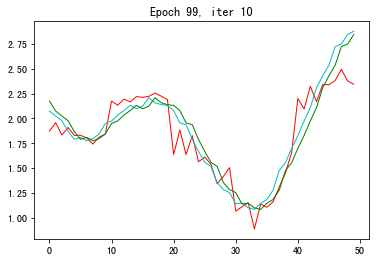

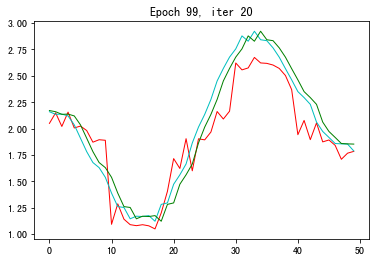

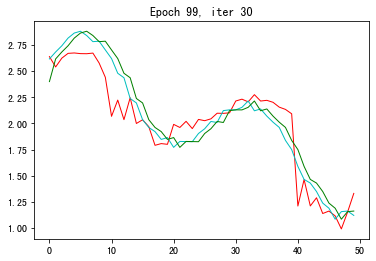

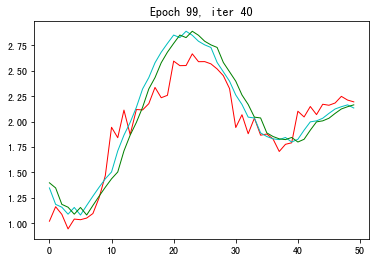

In [46]:
fc_model = FullyConnected(x_size=10, hidden_size=3, output_size=10)
fc_model = fc_model.double()

criterion = nn.MSELoss() # LOSS

# 除了梯度下降，还有很多别的优化方法，此处用的SGD
optimizer = optim.SGD(fc_model.parameters(),lr=0.01)

losses = []

n_epochs = 100

n_iters = 50


for epoch in range(n_epochs):
    for iter_ in range(n_iters):
        inputs_,targets_ = sample_from_table(50, timeserise_revenue)

        inputs = torch.from_numpy(np.array([
                        inputs_[0:10], 
                        inputs_[10:20], 
                        inputs_[20:30], 
                        inputs_[30:40], 
                        inputs_[40:50]], dtype=np.double)) # 输入

        targets = torch.from_numpy(np.array([
                        targets_[0:10], 
                        targets_[10:20], 
                        targets_[20:30], 
                        targets_[30:40], 
                        targets_[40:50]], dtype=np.double)) # 输出

        outputs = fc_model(inputs) # yhat

        loss = criterion(outputs,targets) # loss

        # torch在训练的时候，会默认在每一轮训练的时候，把上一轮训练的梯度留下来，下一次求得的梯度加上它形成新的梯度，某些情况适用，此处不需要
        # 梯度清零，不然会出错
        optimizer.zero_grad() 

        loss.backward() # 反向传播

        optimizer.step() # 更新权值

        losses.append(loss)

        if iter_ % 10 == 0:
            plt.clf()
            plt.ion()

            plt.title("Epoch {}, iter {}".format(epoch, iter_))

            plt.plot(torch.flatten(outputs.detach()),'r-',linewidth=1,label='Output') # 预测数据 - 红色
            plt.plot(torch.flatten(targets),'c-',linewidth=1,label='Label') # 真实数据 - 浅蓝
            plt.plot(torch.flatten(inputs),'g-',linewidth=1,label='Input') # 输入数据 - 绿色

            plt.draw();
            plt.pause(0.05);

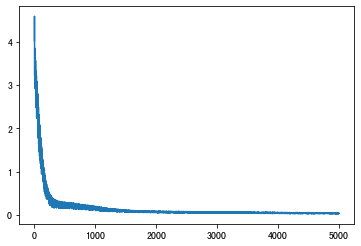

In [47]:
plt.plot(losses)

In [48]:
n_epochs = 100
losses = np.zeros(n_epochs)
losses

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])